In [1]:
import numpy as np
import time, os, sys
from urllib.parse import urlparse
import skimage
import matplotlib.pyplot as plt
import matplotlib as mpl
%matplotlib inline
mpl.rcParams['figure.dpi'] = 300

import mxnet as mx
from cellpose import utils

use_GPU = utils.use_gpu()
print('GPU activated? %d'%use_GPU)

GPU activated? 1


In [24]:
INPUT_PATH = '../data/raw/RAW_TIFF/'
OUTPUT_PATH = '../data/raw/masks/'

In [16]:
from cellpose import models

# DEFINE CELLPOSE MODEL
# model_type='cyto' or model_type='nuclei'
model = models.Cellpose(gpu=use_GPU, model_type='cyto')

>>>> using GPU


In [25]:
def analyse(img):
    # define CHANNELS to run segementation on
    # grayscale=0, R=1, G=2, B=3
    # channels = [cytoplasm, nucleus]
    # if NUCLEUS channel does not exist, set the second channel to 0
    # channels = [0,0]
    # IF ALL YOUR IMAGES ARE THE SAME TYPE, you can give a list with 2 elements
    # channels = [0,0] # IF YOU HAVE GRAYSCALE
    # channels = [2,3] # IF YOU HAVE G=cytoplasm and B=nucleus
    # channels = [2,1] # IF YOU HAVE G=cytoplasm and R=nucleus

    # or if you have different types of channels in each image
    channels = [[3,1], [2,1], [3,2]]

    # if diameter is set to None, the size of the cells is estimated on a per image basis
    # you can set the average cell `diameter` in pixels yourself (recommended) 
    # diameter can be a list or a single number for all images
    masks, flows, styles, diams = model.eval([img,img,img], diameter=None, channels=channels)
    return masks
        

In [ ]:
files = os.listdir(INPUT_PATH)
log = open("out.txt", "w")
for f in files:
    file_path = INPUT_PATH+f
    name = f.split('.')[0]
    print(file_path)
    log.write(file_path)
    img = plt.imread(file_path)
    masks = analyse(img)
    log.write("Got masks.")
    for i,mask in enumerate(masks):
        mask_path ="{}{}_{}_{}.tif".format(OUTPUT_PATH,name,i,mask.max())
        skimage.io.imsave(mask_path,mask)
        log.write(mask_path)
    log.write("-----")

log.close()

  0%|          | 0/3 [00:00<?, ?it/s]

../data/raw/RAW_TIFF/ND8_DIV0+2h_3_ch_4.tif
processing 3 image(s)


  0%|          | 0/3 [00:00<?, ?it/s]

estimated cell diameters for all images


100%|██████████| 3/3 [00:23<00:00,  7.85s/it]
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/ND8_DIV0+2h_3_ch_4_0_64.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/ND8_DIV0+2h_3_ch_4_1_66.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/ND8_DIV0+2h_3_ch_4_2_59.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
  0%|          | 0/3 [00:00<?, ?it/s]

../data/raw/RAW_TIFF/20072019_ND9_ND11_DIV0-1_Daam1_aTub_Phallo_26_ch_4.tif
processing 3 image(s)


  0%|          | 0/3 [00:00<?, ?it/s]

estimated cell diameters for all images


100%|██████████| 3/3 [00:42<00:00, 14.17s/it]
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/20072019_ND9_ND11_DIV0-1_Daam1_aTub_Phallo_26_ch_4_0_230.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/20072019_ND9_ND11_DIV0-1_Daam1_aTub_Phallo_26_ch_4_1_248.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/20072019_ND9_ND11_DIV0-1_Daam1_aTub_Phallo_26_ch_4_2_235.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
  0%|          | 0/3 [00:00<?, ?it/s]

../data/raw/RAW_TIFF/ND8_DIV0+2h_9_ch_4.tif
processing 3 image(s)


  0%|          | 0/3 [00:00<?, ?it/s]

estimated cell diameters for all images


100%|██████████| 3/3 [00:23<00:00,  7.76s/it]
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/ND8_DIV0+2h_9_ch_4_0_52.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/ND8_DIV0+2h_9_ch_4_1_52.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/ND8_DIV0+2h_9_ch_4_2_50.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
  0%|          | 0/3 [00:00<?, ?it/s]

../data/raw/RAW_TIFF/20072019_ND9_ND11_DIV0-1_Daam1_aTub_Phallo_6_ch_4.tif
processing 3 image(s)


  0%|          | 0/3 [00:00<?, ?it/s]

estimated cell diameters for all images


100%|██████████| 3/3 [00:28<00:00,  9.48s/it]
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/20072019_ND9_ND11_DIV0-1_Daam1_aTub_Phallo_6_ch_4_0_185.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/20072019_ND9_ND11_DIV0-1_Daam1_aTub_Phallo_6_ch_4_1_178.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/20072019_ND9_ND11_DIV0-1_Daam1_aTub_Phallo_6_ch_4_2_180.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
  0%|          | 0/3 [00:00<?, ?it/s]

../data/raw/RAW_TIFF/ND8_DIV0+4h_20x_noConfinment_5_ch_4.tif
processing 3 image(s)


  0%|          | 0/3 [00:00<?, ?it/s]

estimated cell diameters for all images


100%|██████████| 3/3 [00:35<00:00, 11.85s/it]
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/ND8_DIV0+4h_20x_noConfinment_5_ch_4_0_412.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/ND8_DIV0+4h_20x_noConfinment_5_ch_4_1_436.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/ND8_DIV0+4h_20x_noConfinment_5_ch_4_2_393.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
  0%|          | 0/3 [00:00<?, ?it/s]

../data/raw/RAW_TIFF/ND8_DIV0+2h_7_ch_4.tif
processing 3 image(s)


  0%|          | 0/3 [00:00<?, ?it/s]

estimated cell diameters for all images


100%|██████████| 3/3 [00:15<00:00,  5.07s/it]
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/ND8_DIV0+2h_7_ch_4_0_52.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/ND8_DIV0+2h_7_ch_4_1_55.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/ND8_DIV0+2h_7_ch_4_2_53.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
  0%|          | 0/3 [00:00<?, ?it/s]

../data/raw/RAW_TIFF/20072019_ND9_ND11_DIV0-1_Daam1_aTub_Phallo_9_ch_4.tif
processing 3 image(s)


  0%|          | 0/3 [00:00<?, ?it/s]

estimated cell diameters for all images


100%|██████████| 3/3 [00:33<00:00, 11.06s/it]
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/20072019_ND9_ND11_DIV0-1_Daam1_aTub_Phallo_9_ch_4_0_131.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/20072019_ND9_ND11_DIV0-1_Daam1_aTub_Phallo_9_ch_4_1_139.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/20072019_ND9_ND11_DIV0-1_Daam1_aTub_Phallo_9_ch_4_2_122.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
  0%|          | 0/3 [00:00<?, ?it/s]

../data/raw/RAW_TIFF/ND8_DIV0+4h_20x_noConfinment_7_ch_4.tif
processing 3 image(s)


  0%|          | 0/3 [00:00<?, ?it/s]

estimated cell diameters for all images


100%|██████████| 3/3 [00:39<00:00, 13.12s/it]
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/ND8_DIV0+4h_20x_noConfinment_7_ch_4_0_553.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/ND8_DIV0+4h_20x_noConfinment_7_ch_4_1_569.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/ND8_DIV0+4h_20x_noConfinment_7_ch_4_2_507.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
  0%|          | 0/3 [00:00<?, ?it/s]

../data/raw/RAW_TIFF/20072019_ND9_ND11_DIV0-1_Daam1_aTub_Phallo_1_ch_4.tif
processing 3 image(s)


  0%|          | 0/3 [00:00<?, ?it/s]

estimated cell diameters for all images


100%|██████████| 3/3 [00:26<00:00,  8.77s/it]
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/20072019_ND9_ND11_DIV0-1_Daam1_aTub_Phallo_1_ch_4_0_166.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/20072019_ND9_ND11_DIV0-1_Daam1_aTub_Phallo_1_ch_4_1_169.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/20072019_ND9_ND11_DIV0-1_Daam1_aTub_Phallo_1_ch_4_2_165.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
  0%|          | 0/3 [00:00<?, ?it/s]

../data/raw/RAW_TIFF/20072019_ND9_ND11_DIV0-1_Daam1_aTub_Phallo_19_ch_4.tif
processing 3 image(s)


  0%|          | 0/3 [00:00<?, ?it/s]

estimated cell diameters for all images


100%|██████████| 3/3 [00:31<00:00, 10.54s/it]
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/20072019_ND9_ND11_DIV0-1_Daam1_aTub_Phallo_19_ch_4_0_173.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/20072019_ND9_ND11_DIV0-1_Daam1_aTub_Phallo_19_ch_4_1_189.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/20072019_ND9_ND11_DIV0-1_Daam1_aTub_Phallo_19_ch_4_2_171.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
  0%|          | 0/3 [00:00<?, ?it/s]

../data/raw/RAW_TIFF/ND8_DIV0+2h_2_ch_4.tif
processing 3 image(s)


  0%|          | 0/3 [00:00<?, ?it/s]

estimated cell diameters for all images


100%|██████████| 3/3 [00:29<00:00,  9.92s/it]
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/ND8_DIV0+2h_2_ch_4_0_60.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/ND8_DIV0+2h_2_ch_4_1_67.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/ND8_DIV0+2h_2_ch_4_2_60.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
  0%|          | 0/3 [00:00<?, ?it/s]

../data/raw/RAW_TIFF/20072019_ND9_ND11_DIV0-1_Daam1_aTub_Phallo_31_ch_4.tif
processing 3 image(s)


  0%|          | 0/3 [00:00<?, ?it/s]

estimated cell diameters for all images


100%|██████████| 3/3 [00:45<00:00, 15.30s/it]
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/20072019_ND9_ND11_DIV0-1_Daam1_aTub_Phallo_31_ch_4_0_143.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/20072019_ND9_ND11_DIV0-1_Daam1_aTub_Phallo_31_ch_4_1_177.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/20072019_ND9_ND11_DIV0-1_Daam1_aTub_Phallo_31_ch_4_2_164.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
  0%|          | 0/3 [00:00<?, ?it/s]

../data/raw/RAW_TIFF/ND8_DIV0+2h_6_ch_4.tif
processing 3 image(s)


  0%|          | 0/3 [00:00<?, ?it/s]

estimated cell diameters for all images


100%|██████████| 3/3 [00:15<00:00,  5.23s/it]
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/ND8_DIV0+2h_6_ch_4_0_66.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/ND8_DIV0+2h_6_ch_4_1_73.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/ND8_DIV0+2h_6_ch_4_2_66.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
  0%|          | 0/3 [00:00<?, ?it/s]

../data/raw/RAW_TIFF/ND8_DIV0+2h_5_ch_4.tif
processing 3 image(s)


  0%|          | 0/3 [00:00<?, ?it/s]

estimated cell diameters for all images


100%|██████████| 3/3 [00:24<00:00,  8.31s/it]
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/ND8_DIV0+2h_5_ch_4_0_48.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/ND8_DIV0+2h_5_ch_4_1_56.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/ND8_DIV0+2h_5_ch_4_2_46.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
  0%|          | 0/3 [00:00<?, ?it/s]

../data/raw/RAW_TIFF/20072019_ND9_ND11_DIV0-1_Daam1_aTub_Phallo_18_ch_4.tif
processing 3 image(s)


  0%|          | 0/3 [00:00<?, ?it/s]

estimated cell diameters for all images


100%|██████████| 3/3 [00:33<00:00, 11.09s/it]
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/20072019_ND9_ND11_DIV0-1_Daam1_aTub_Phallo_18_ch_4_0_149.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/20072019_ND9_ND11_DIV0-1_Daam1_aTub_Phallo_18_ch_4_1_155.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/20072019_ND9_ND11_DIV0-1_Daam1_aTub_Phallo_18_ch_4_2_138.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
  0%|          | 0/3 [00:00<?, ?it/s]

../data/raw/RAW_TIFF/20072019_ND9_ND11_DIV0-1_Daam1_aTub_Phallo_22_ch_4.tif
processing 3 image(s)


  0%|          | 0/3 [00:00<?, ?it/s]

estimated cell diameters for all images


100%|██████████| 3/3 [00:37<00:00, 12.53s/it]
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/20072019_ND9_ND11_DIV0-1_Daam1_aTub_Phallo_22_ch_4_0_133.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/20072019_ND9_ND11_DIV0-1_Daam1_aTub_Phallo_22_ch_4_1_83.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/20072019_ND9_ND11_DIV0-1_Daam1_aTub_Phallo_22_ch_4_2_124.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
  0%|          | 0/3 [00:00<?, ?it/s]

../data/raw/RAW_TIFF/20072019_ND9_ND11_DIV0-1_Daam1_aTub_Phallo_20_ch_4.tif
processing 3 image(s)


  0%|          | 0/3 [00:00<?, ?it/s]

estimated cell diameters for all images


100%|██████████| 3/3 [00:28<00:00,  9.57s/it]
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/20072019_ND9_ND11_DIV0-1_Daam1_aTub_Phallo_20_ch_4_0_130.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/20072019_ND9_ND11_DIV0-1_Daam1_aTub_Phallo_20_ch_4_1_131.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/20072019_ND9_ND11_DIV0-1_Daam1_aTub_Phallo_20_ch_4_2_120.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
  0%|          | 0/3 [00:00<?, ?it/s]

../data/raw/RAW_TIFF/20072019_ND9_ND11_DIV0-1_Daam1_aTub_Phallo_21_ch_4.tif
processing 3 image(s)


  0%|          | 0/3 [00:00<?, ?it/s]

estimated cell diameters for all images


100%|██████████| 3/3 [00:45<00:00, 15.27s/it]
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/20072019_ND9_ND11_DIV0-1_Daam1_aTub_Phallo_21_ch_4_0_72.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/20072019_ND9_ND11_DIV0-1_Daam1_aTub_Phallo_21_ch_4_1_85.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/20072019_ND9_ND11_DIV0-1_Daam1_aTub_Phallo_21_ch_4_2_68.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
  0%|          | 0/3 [00:00<?, ?it/s]

../data/raw/RAW_TIFF/20072019_ND9_ND11_DIV0-1_Daam1_aTub_Phallo_4_ch_4.tif
processing 3 image(s)


  0%|          | 0/3 [00:00<?, ?it/s]

estimated cell diameters for all images


100%|██████████| 3/3 [00:25<00:00,  8.42s/it]
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/20072019_ND9_ND11_DIV0-1_Daam1_aTub_Phallo_4_ch_4_0_159.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/20072019_ND9_ND11_DIV0-1_Daam1_aTub_Phallo_4_ch_4_1_157.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/20072019_ND9_ND11_DIV0-1_Daam1_aTub_Phallo_4_ch_4_2_147.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
  0%|          | 0/3 [00:00<?, ?it/s]

../data/raw/RAW_TIFF/20072019_ND9_ND11_DIV0-1_Daam1_aTub_Phallo_10_ch_4.tif
processing 3 image(s)


  0%|          | 0/3 [00:00<?, ?it/s]

estimated cell diameters for all images


100%|██████████| 3/3 [00:35<00:00, 11.71s/it]
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/20072019_ND9_ND11_DIV0-1_Daam1_aTub_Phallo_10_ch_4_0_220.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/20072019_ND9_ND11_DIV0-1_Daam1_aTub_Phallo_10_ch_4_1_227.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/20072019_ND9_ND11_DIV0-1_Daam1_aTub_Phallo_10_ch_4_2_216.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
  0%|          | 0/3 [00:00<?, ?it/s]

../data/raw/RAW_TIFF/20072019_ND9_ND11_DIV0-1_Daam1_aTub_Phallo_14_ch_4.tif
processing 3 image(s)


  0%|          | 0/3 [00:00<?, ?it/s]

estimated cell diameters for all images


100%|██████████| 3/3 [00:30<00:00, 10.24s/it]
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/20072019_ND9_ND11_DIV0-1_Daam1_aTub_Phallo_14_ch_4_0_273.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/20072019_ND9_ND11_DIV0-1_Daam1_aTub_Phallo_14_ch_4_1_283.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/20072019_ND9_ND11_DIV0-1_Daam1_aTub_Phallo_14_ch_4_2_257.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
  0%|          | 0/3 [00:00<?, ?it/s]

../data/raw/RAW_TIFF/20072019_ND9_ND11_DIV0-1_Daam1_aTub_Phallo_12_ch_4.tif
processing 3 image(s)


  0%|          | 0/3 [00:00<?, ?it/s]

estimated cell diameters for all images


100%|██████████| 3/3 [00:28<00:00,  9.59s/it]
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/20072019_ND9_ND11_DIV0-1_Daam1_aTub_Phallo_12_ch_4_0_192.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/20072019_ND9_ND11_DIV0-1_Daam1_aTub_Phallo_12_ch_4_1_180.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/20072019_ND9_ND11_DIV0-1_Daam1_aTub_Phallo_12_ch_4_2_160.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
  0%|          | 0/3 [00:00<?, ?it/s]

../data/raw/RAW_TIFF/20072019_ND9_ND11_DIV0-1_Daam1_aTub_Phallo_17_ch_4.tif
processing 3 image(s)


  0%|          | 0/3 [00:00<?, ?it/s]

estimated cell diameters for all images


100%|██████████| 3/3 [00:30<00:00, 10.22s/it]
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/20072019_ND9_ND11_DIV0-1_Daam1_aTub_Phallo_17_ch_4_0_162.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/20072019_ND9_ND11_DIV0-1_Daam1_aTub_Phallo_17_ch_4_1_176.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/20072019_ND9_ND11_DIV0-1_Daam1_aTub_Phallo_17_ch_4_2_159.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
  0%|          | 0/3 [00:00<?, ?it/s]

../data/raw/RAW_TIFF/ND8_DIV0+2h_1_ch_4.tif
processing 3 image(s)


  0%|          | 0/3 [00:00<?, ?it/s]

estimated cell diameters for all images


100%|██████████| 3/3 [00:25<00:00,  8.61s/it]
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/ND8_DIV0+2h_1_ch_4_0_61.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/ND8_DIV0+2h_1_ch_4_1_69.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/ND8_DIV0+2h_1_ch_4_2_56.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
  0%|          | 0/3 [00:00<?, ?it/s]

../data/raw/RAW_TIFF/20072019_ND9_ND11_DIV0-1_Daam1_aTub_Phallo_7_ch_4.tif
processing 3 image(s)


  0%|          | 0/3 [00:00<?, ?it/s]

estimated cell diameters for all images


100%|██████████| 3/3 [00:25<00:00,  8.34s/it]
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/20072019_ND9_ND11_DIV0-1_Daam1_aTub_Phallo_7_ch_4_0_23.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/20072019_ND9_ND11_DIV0-1_Daam1_aTub_Phallo_7_ch_4_1_20.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/20072019_ND9_ND11_DIV0-1_Daam1_aTub_Phallo_7_ch_4_2_28.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
  0%|          | 0/3 [00:00<?, ?it/s]

../data/raw/RAW_TIFF/ND8_DIV0+2h_10_ch_4.tif
processing 3 image(s)


  0%|          | 0/3 [00:00<?, ?it/s]

estimated cell diameters for all images


100%|██████████| 3/3 [00:18<00:00,  6.09s/it]
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/ND8_DIV0+2h_10_ch_4_0_47.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/ND8_DIV0+2h_10_ch_4_1_51.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/ND8_DIV0+2h_10_ch_4_2_45.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
  0%|          | 0/3 [00:00<?, ?it/s]

../data/raw/RAW_TIFF/ND8_DIV0+4h_20x_noConfinment_2_ch_4.tif
processing 3 image(s)


100%|██████████| 3/3 [00:14<00:00,  4.69s/it]
/home/mzouink/miniconda3/envs/cellenv/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3334: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/mzouink/miniconda3/envs/cellenv/lib/python3.8/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
  0%|          | 0/3 [00:00<?, ?it/s]

estimated cell diameters for all images


100%|██████████| 3/3 [00:36<00:00, 12.05s/it]
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/ND8_DIV0+4h_20x_noConfinment_2_ch_4_0_0.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/ND8_DIV0+4h_20x_noConfinment_2_ch_4_1_0.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/ND8_DIV0+4h_20x_noConfinment_2_ch_4_2_0.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
  0%|          | 0/3 [00:00<?, ?it/s]

../data/raw/RAW_TIFF/20072019_ND9_ND11_DIV0-1_Daam1_aTub_Phallo_23_ch_4.tif
processing 3 image(s)


  0%|          | 0/3 [00:00<?, ?it/s]

estimated cell diameters for all images


100%|██████████| 3/3 [00:37<00:00, 12.45s/it]
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/20072019_ND9_ND11_DIV0-1_Daam1_aTub_Phallo_23_ch_4_0_149.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/20072019_ND9_ND11_DIV0-1_Daam1_aTub_Phallo_23_ch_4_1_258.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/20072019_ND9_ND11_DIV0-1_Daam1_aTub_Phallo_23_ch_4_2_269.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
  0%|          | 0/3 [00:00<?, ?it/s]

../data/raw/RAW_TIFF/20072019_ND9_ND11_DIV0-1_Daam1_aTub_Phallo_28_ch_4.tif
processing 3 image(s)


  0%|          | 0/3 [00:00<?, ?it/s]

estimated cell diameters for all images


100%|██████████| 3/3 [00:42<00:00, 14.10s/it]
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/20072019_ND9_ND11_DIV0-1_Daam1_aTub_Phallo_28_ch_4_0_248.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/20072019_ND9_ND11_DIV0-1_Daam1_aTub_Phallo_28_ch_4_1_262.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/20072019_ND9_ND11_DIV0-1_Daam1_aTub_Phallo_28_ch_4_2_314.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
  0%|          | 0/3 [00:00<?, ?it/s]

../data/raw/RAW_TIFF/20072019_ND9_ND11_DIV0-1_Daam1_aTub_Phallo_2_ch_4.tif
processing 3 image(s)


  0%|          | 0/3 [00:00<?, ?it/s]

estimated cell diameters for all images


100%|██████████| 3/3 [00:24<00:00,  8.16s/it]
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/20072019_ND9_ND11_DIV0-1_Daam1_aTub_Phallo_2_ch_4_0_90.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/20072019_ND9_ND11_DIV0-1_Daam1_aTub_Phallo_2_ch_4_1_88.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/20072019_ND9_ND11_DIV0-1_Daam1_aTub_Phallo_2_ch_4_2_82.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
  0%|          | 0/3 [00:00<?, ?it/s]

../data/raw/RAW_TIFF/20072019_ND9_ND11_DIV0-1_Daam1_aTub_Phallo_24_ch_4.tif
processing 3 image(s)


  0%|          | 0/3 [00:00<?, ?it/s]

estimated cell diameters for all images


100%|██████████| 3/3 [00:42<00:00, 14.08s/it]
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/20072019_ND9_ND11_DIV0-1_Daam1_aTub_Phallo_24_ch_4_0_126.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/20072019_ND9_ND11_DIV0-1_Daam1_aTub_Phallo_24_ch_4_1_97.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/20072019_ND9_ND11_DIV0-1_Daam1_aTub_Phallo_24_ch_4_2_135.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
  0%|          | 0/3 [00:00<?, ?it/s]

../data/raw/RAW_TIFF/ND8_DIV0+2h_4_ch_4.tif
processing 3 image(s)


  0%|          | 0/3 [00:00<?, ?it/s]

estimated cell diameters for all images


100%|██████████| 3/3 [00:14<00:00,  4.90s/it]
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/ND8_DIV0+2h_4_ch_4_0_60.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/ND8_DIV0+2h_4_ch_4_1_64.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/ND8_DIV0+2h_4_ch_4_2_59.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
  0%|          | 0/3 [00:00<?, ?it/s]

../data/raw/RAW_TIFF/ND8_DIV0+4h_20x_noConfinment_4_ch_4.tif
processing 3 image(s)


  0%|          | 0/3 [00:00<?, ?it/s]

estimated cell diameters for all images


100%|██████████| 3/3 [00:34<00:00, 11.46s/it]
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/ND8_DIV0+4h_20x_noConfinment_4_ch_4_0_358.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/ND8_DIV0+4h_20x_noConfinment_4_ch_4_1_408.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
<ipython-input-28-0dfe568e4887>:13: UserWarning: ../data/raw/masks/ND8_DIV0+4h_20x_noConfinment_4_ch_4_2_350.tif is a low contrast image
  skimage.io.imsave(mask_path,mask)
  0%|          | 0/3 [00:00<?, ?it/s]

../data/raw/RAW_TIFF/ND8_DIV0+4h_20x_noConfinment_3_ch_4.tif
processing 3 image(s)


  0%|          | 0/3 [00:00<?, ?it/s]

estimated cell diameters for all images


 33%|███▎      | 1/3 [00:11<00:23, 11.51s/it]

Max: 230


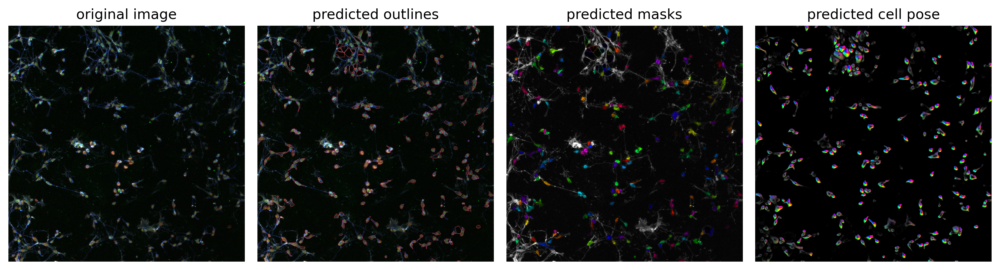

Max: 230


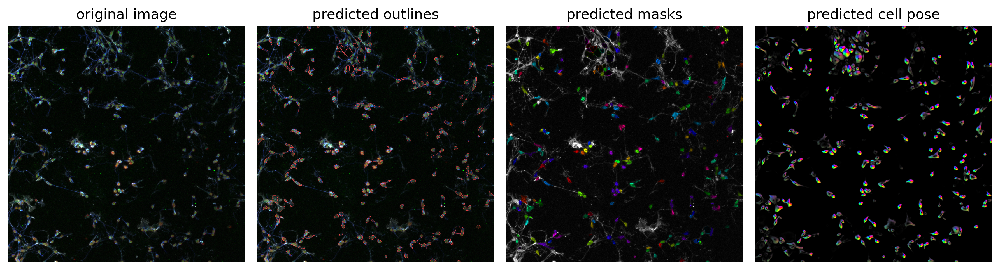

Max: 235


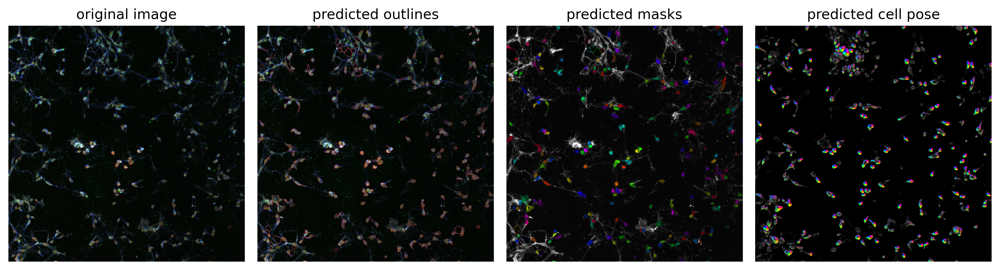

In [13]:
from cellpose import plot
    
nimg = len([img,img,img])
for idx in range(nimg):
    maski = masks[idx]
    flowi = flows[idx][0]
    print("Max: %d"%maski.max())
    fig = plt.figure(figsize=(12,5))
    plot.show_segmentation(fig, img, maski, flowi, channels=channels[idx])
    plt.tight_layout()
    plt.show()

In [4]:

# plt.imshow(masks[0])
# plt.savefig('mask.png')

In [12]:
print("Max: %d"%masks[0].max())

Max: 230


In [15]:
skimage.io.imsave("mask.tiff",masks[0])

<ipython-input-15-55fb8090e340>:1: UserWarning: mask.tiff is a low contrast image
  skimage.io.imsave("mask.tiff",masks[0])


In [18]:
for mask in masks:
    print("Max: %d"%mask.max())

Max: 230
Max: 230
Max: 235


In [5]:
# plt.imshow(dst)
# plt.savefig('mix.png')